In [1]:
%load_ext autoreload
%autoreload 2

# import intake
import numpy as np
import netCDF4 as nc
import xarray as xr
import os
from matplotlib import pyplot as plt
#import xesmf as xe
import pandas as pd
import pickle
import cartopy.crs as ccrs
import cartopy.feature as cfeature
# import matplotlib.ticker as mticker
# from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
#from gfdl_grid_paper import *
import momlevel
import glob
#import cf_xarray as cfxr
from scipy.interpolate import griddata

In [2]:
inputdir='/glade/work/clittle/p2521/input/'
inputdir2='/glade/work/clittle/p2521/'
modeldir='model/'
# ds_grid = xr.open_dataset(inputdir+modeldir+'ESM4_ocean_static.nc')
# ds_grid_esm4=ds_grid[['geolon','geolat','geolon_c','geolat_c','wet','areacello', 'deptho']]

In [3]:
tgcsvin = './tg_locs_gs.csv'
# temp

In [4]:
margin = 2

def cutdomain(ds, margin):
    # Common variations of latitude and longitude names
    latitude_names = ['lat', 'latitude', 'Latitude', 'LAT', 'nav_lat']
    longitude_names = ['lon', 'longitude', 'Longitude', 'LON', 'nav_lon']

    #latitude_names = ds.cf.coordinates['latitude'][0]
    #longitude_names = ds.cf.coordinates['longitude'][0]

    # Identify the latitude and longitude coordinate names in the dataset
    lat_name = next((name for name in latitude_names if name in ds.coords), None)
    lon_name = next((name for name in longitude_names if name in ds.coords), None)

    if lat_name is None or lon_name is None:
        raise ValueError("Latitude or longitude coordinate not found in the dataset.")
   
    # Ensure that latitude and longitude arrays are computed before using them for indexing
    ds[lat_name] = ds[lat_name].compute()
    ds[lon_name] = ds[lon_name].compute()

    # Apply the margin-based conditions using the detected latitude and longitude names
    ds = ds.where(ds[lat_name] < max_lat + margin, drop=True)
    ds = ds.where(ds[lat_name] > min_lat - margin, drop=True)
    ds = ds.where(ds[lon_name] < max_lon + margin, drop=True)
    ds = ds.where(ds[lon_name] > min_lon - margin, drop=True)

    return ds

In [5]:
def model_dim_check(ds):
    if 'j' not in list(ds.dims):
        ds = ds.rename({'y':'j', 'x':'i','lat':'latitude', 'lon':'longitude'})#.drop(#['lon']#=ds_grid.geolon.values
        
    if 'lat_bnds' in list(ds.keys()):
        ds = ds.rename({'lat_bnds':'vertices_latitude', 'lon_bnds':'vertices_longitude', 'vertex':'vertices'})#.drop(#['lon']#=ds_grid.geolon.values

    if 'bounds_lat' in list(ds.keys()):
        ds = ds.rename({'bounds_lat':'vertices_latitude', 'bounds_lon':'vertices_longitude', 'nvertex':'vertices'})#.drop(#['lon']#=ds_grid.geolon.values
        
    # Common variations of latitude and longitude names
    latitude_names = ['lat', 'latitude', 'Latitude', 'LAT', 'nav_lat']
    longitude_names = ['lon', 'longitude', 'Longitude', 'LON', 'nav_lon']

    #latitude_names = ds.cf.coordinates['latitude'][0]
    #longitude_names = ds.cf.coordinates['longitude'][0]

    # Identify the latitude and longitude coordinate names in the dataset
    lat_name = next((name for name in latitude_names if name in ds.coords), None)
    lon_name = next((name for name in longitude_names if name in ds.coords), None)
    
    if ds.sizes['i'] > ds.sizes['j']:
        print('i dimension is larger than j dimension. Therefore, dimension names need to be swapped')
        ds = ds.rename({'i':'i_temp', 'j':'j_temp'})
        ds = ds.rename({'i_temp':'j', 'j_temp':'i'})
        print('dimension names swapped')

    else:
        #ds.sizes['i'] < ds.sizes['j']
        print('no swapping of i and j dimensions')

    if ds[lon_name].min() < 0:
        print('longitude ranges from -180 to 180. This needs to be changed as 0 to 360')
        temp = ds[lon_name]
        temp = (temp+360)%360
        ds = ds.drop_vars('longitude')
        ds = ds.assign_coords(longitude=(['i', 'j'], temp.data))
        print('longitude values changed')

    return(ds)

In [6]:
import numpy as np
import xarray as xr
import cftime

EPOCH = np.datetime64('1970-01-01T00:00:00')

def cftime_to_datetime64ns_da(time_da: xr.DataArray) -> xr.DataArray:
    """Convert CFTime/object datetimes to numpy datetime64[ns] (dask-safe)."""
    units = 'seconds since 1970-01-01 00:00:00'
    cal = (time_da.encoding.get('calendar')
           or time_da.attrs.get('calendar')
           or 'proleptic_gregorian')
    def _block(x):
        secs = cftime.date2num(x.ravel().tolist(), units=units, calendar=cal)
        ns = np.round(np.asarray(secs) * 1e9).astype('int64')
        out = EPOCH + ns.astype('timedelta64[ns]')
        return out.reshape(x.shape)
    return xr.apply_ufunc(_block, time_da, dask='parallelized',
                          output_dtypes=[np.dtype('datetime64[ns]')])

def ensure_time_datetime64ns(ds: xr.Dataset) -> xr.Dataset:
    """Return a copy with time as numpy datetime64[ns]."""
    t = ds['time']
    if np.issubdtype(t.dtype, np.datetime64):
        t_ns = t.astype('datetime64[ns]')
    elif t.dtype == object:
        # object array: could be Python datetime or CFTime; use CFTime path (works for both)
        t_ns = cftime_to_datetime64ns_da(t)
    else:
        raise TypeError(f"Unsupported time dtype: {t.dtype}")
    return ds.assign_coords(time=t_ns)

def ensure_time_bnds_datetime64ns(ds: xr.Dataset) -> xr.Dataset:
    if 'time_bnds' in ds.variables and not np.issubdtype(ds['time_bnds'].dtype, np.datetime64):
        ds = ds.copy()
        ds['time_bnds'] = cftime_to_datetime64ns_da(ds['time_bnds'])
    return ds

In [7]:
def regrid_simple_interp(ds, var="zos"):
    """
    Regrid to 1x1 degree using nearest-neighbor mapping of native (i,j) -> (lat,lon).
    Works even when grid is curvilinear.
    """
    # Extract 2D lat/lon
    lat = ds["latitude"]
    lon = ds["longitude"]

    # Create target grid
    target_lat = np.arange(-89.5, 90.5, 1.0)
    target_lon = np.arange(-179.5, 180.0, 1.0)
    lon2d, lat2d = np.meshgrid(target_lon, target_lat)

    # Flatten source and target
    pts_src = np.column_stack([lat.values.ravel(), lon.values.ravel()])
    pts_tgt = np.column_stack([lat2d.ravel(), lon2d.ravel()])

    # Interpolate each time slice with scipy.griddata
    import scipy.interpolate as spi

    out_list = []
    for t in range(ds.sizes["time"]):
        vals = ds[var].isel(time=t).values.ravel()
        vals_interp = spi.griddata(pts_src, vals, pts_tgt, method="linear")
        out_list.append(vals_interp.reshape(lat2d.shape))

    out = xr.DataArray(
        np.stack(out_list, axis=0),
        dims=("time", "lat", "lon"),
        coords={"time": ds["time"], "lat": target_lat, "lon": target_lon},
        name=var,
    )

    return out.to_dataset()


In [8]:
import numpy as np
import xarray as xr
import xesmf as xe        # for regridding
import pop_tools          # for POP model grid definitions
# If using helper functions for bounds
import xesmf.util as regrid  

# For plotting or checking results
import matplotlib.pyplot as plt


## Define 2x2 destgrid
# destgrid = xr.Dataset({'lat':np.arange(-90,91,1),'lon':np.arange(0,360,1)})
destgrid = xr.Dataset({'lat':np.arange(-90,90.5,.5),'lon':np.arange(0,360,.5)})
ny = destgrid.sizes['lat']
nx = destgrid.sizes['lon']
destgrid['mask'] = xr.DataArray(np.ones((ny,nx)),dims=["lat", "lon"],coords={"lat": destgrid.lat, "lon": destgrid.lon})
rEarth = 6378.1
destgrid['area'] = xr.DataArray(np.ones((ny,nx)),dims=["lat", "lon"],coords={"lat": destgrid.lat, "lon": destgrid.lon})*np.cos(np.deg2rad(destgrid.lat))*rEarth**2
destgrid['lat'] = destgrid['lat'].assign_attrs({'units':'degrees_north','long_name':'latitude'})
destgrid['lon'] = destgrid['lon'].assign_attrs({'units':'degrees_east','long_name':'longitude'})



def make_bounds(coord, bound_name):
    # assumes evenly spaced grid
    delta = (coord[1] - coord[0]) / 2
    bounds = np.concatenate(([coord[0] - delta],
                             coord[:-1] + delta,
                             [coord[-1] + delta]))
    return xr.DataArray(
        np.vstack([bounds[:-1], bounds[1:]]).T,
        dims=[coord.dims[0], "nbounds"],
        coords={coord.dims[0]: coord}
    )

# Example: add lat_b, lon_b
destgrid["lat_b"] = make_bounds(destgrid["lat"], "lat_b")
destgrid["lon_b"] = make_bounds(destgrid["lon"], "lon_b")


#destgrid = regrid.add_xesmf_bounds(destgrid)

def POP_grid_for_xesmf(ds):
    """ 
    Given a POP grid dataset with [TLAT,TLONG,ULAT,ULONG], modify so that
    dataset is suitable for conservative regridding using xesmf. Assumes
    mapping from T-grid, so [ULAT,ULONG] give lat/lon bounds.
    """
    ulat = ds.ULAT.rename({'nlat':'y_b','nlon':'x_b'})
    ulon = ds.ULONG.rename({'nlat':'y_b','nlon':'x_b'})
    tlat = ds.TLAT.rename({'nlat':'y','nlon':'x'})
    tlon = ds.TLONG.rename({'nlat':'y','nlon':'x'})
    ulat_b = xr.concat([ulat.isel(x_b=-1),ulat],dim='x_b')
    dy = ulat_b.isel(y_b=1) - ulat_b.isel(y_b=0)
    ulat_b = xr.concat([ulat_b.isel(y_b=0)-dy,ulat_b],dim='y_b')
    ulon_b = xr.concat([ulon.isel(x_b=-1),ulon],dim='x_b')
    ulon_b = xr.concat([ulon_b.isel(y_b=0),ulon_b],dim='y_b')
    ds = ds.assign_coords({'lon_b':ulon_b.transpose(),'lat_b':ulat_b.transpose(),'lon':tlon,'lat':tlat})
    ds = ds.drop(['ULAT','ULONG','TLONG','TLAT'])
    return ds

import pop_tools
ds_t13 = pop_tools.get_grid('POP_tx0.1v3')
ds_t13 = POP_grid_for_xesmf(ds_t13)
ds_g16 = pop_tools.get_grid('POP_gx1v6')
ds_g16 = POP_grid_for_xesmf(ds_g16)


/glade/derecho/scratch/netige/tmp/ipykernel_111123/2024512246.py:60: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  ds = ds.drop(['ULAT','ULONG','TLONG','TLAT'])


In [9]:
import numpy as np
import xarray as xr
import xesmf as xe
import glob


def regrid_to_1deg(ds, ds_grid, var="zos", method="conservative"):
    """
    Regrid dataset variable [var] to 1x1 degree lat-lon grid.
    Keeps time dimension, interpolates spatial.
    """
    regridder = xe.Regridder(ds, ds_grid, method, ignore_degenerate=True)
    ds_regrid = regridder(ds[var])  # regrid only zos
    ds_regrid = ds_regrid.to_dataset(name=var)
    return ds_regrid

In [10]:
%%time
# Define available models
mods = [
    #"DTU22",
    "CNRM-CM6-1",
    "CNRM-CM6-1-HR",
    #"EC-Earth3P",
    #"EC-Earth3P-HR",
    "GFDL-ESM4",
    "GFDL-CM4",
    "HadGEM3-GC31-LL",
    "HadGEM3-GC31-MM",
    #"HadGEM3-GC31-HM",
    #"HadGEM3-GC31-HH",
    "ECMWF-IFS-LR",
    "ECMWF-IFS-MR",
    #"ECMWF-IFS-HR",
     #"CMCC-CM2-HR4",
    # "CMCC-CM2-VHR4",
    # "HadGEM3-GC31-HH"
]
ds_models_zos=[]
source_ids = mods#[4:6]
for i in range(len(source_ids)):
    source_id=source_ids[i]
    if (source_id=="DTU22"):
        ds_zos = xr.open_dataset("/glade/work/clittle/p2521/input/obs/dtuuh22mdt.nc")
    else:
        if (source_id=="GFDL-ESM4") or (source_id=="GFDL-CM4"):
            ds_zos = xr.open_mfdataset(inputdir2+'zos_Omon_'+source_id+'*.nc')
            ds_zos = ds_zos.rename({'y':'j', 'x':'i','lat':'latitude', 'lon':'longitude'})#.drop(#['lon']#=ds_grid.geolon.values
        else:
            filepath = f'/glade/work/netige/Data/CMIP6_Downloader/data/s_{source_id}_e_hist-1950_vl_r1i*_f_mon_v_zos/'
            ds_zos_flist1 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_199*.nc'))
            ds_zos_flist2 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_200*.nc'))#[0-9].nc'))
            ds_zos_flist3 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_201*.nc'))
            #ds_zos_flist4 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_202*.nc'))
            ds_zos_flist = (ds_zos_flist1+ds_zos_flist2+ds_zos_flist3)
            ds_zos = xr.open_mfdataset(ds_zos_flist)        # print(i)
        
    # #Check if model dimensions are compatible to run cutdomain. If not modify model dimensions
        ds_zos = model_dim_check(ds_zos)
    

    if (source_id=="DTU22"):
        ds_model = ds_zos.rename({'mdt':'zos'}).drop_vars('err_mdt')
    else:
        ds_model = ds_zos.sel(time=slice('1993-01', '2014-12'))

    # ---- Add a COMMON NUMERIC TIME CLOCK (optional but handy) ----
    # This gives you the SAME convention (MJD days) on every dataset

    if np.issubdtype(ds_model['time'].dtype, np.datetime64) is False:
        ds_model = ensure_time_datetime64ns(ds_model)
        ds_model = ensure_time_bnds_datetime64ns(ds_model)
        print(source_ids[i] + "time converted to datetime64")
    ##    ds_model = ds_model.rename({'time': 'time_cf'})
    #    time_mjd = to_mjd_days(ds_model['time_cf'])        # has dim 'time_cf'
    #    ds_model = ds_model.assign_coords(time=time_mjd)   # <-- no tuple; DA is OK here
    ##    ds_model = ds_model.swap_dims({'time_cf': 'time'})
    #    ds_model = ds_model.set_coords('time_cf')
    #    ds_model['time'].attrs.update({
    #        'units': 'days since 1858-11-17 00:00:00',
    #        'long_name': 'Modified Julian Day'
    #    })
    
    # Append to list
    #ds_model_zos.to_netcdf(f"./zos_{source_id}.nc")
        #ds_model=ds_model.mean(dim='year').compute()  
    ds_model = ds_model.chunk({"time": -1})            # single time chunk
    #ds_model = ds_model.zos

    #ds_model = POP_grid_for_xesmf(ds_model)
    
    ds_model = regrid_to_1deg(ds_model, destgrid, method = "bilinear")
    ds_models_zos.append(ds_model)
    print('Done with ' + source_ids[i])
# ds_models



i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
Done with CNRM-CM6-1
i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
Done with CNRM-CM6-1-HR
i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
GFDL-ESM4time converted to datetime64
Done with GFDL-ESM4
i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
GFDL-CM4time converted to datetime64
Done with GFDL-CM4
i dimension i

/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/xarray/core/computation.py:316: PerformanceWarning: Regridding is increasing the number of chunks by a factor of 6.0, you might want to specify sizes in `output_chunks` in the regridder call. Default behaviour is to preserve the chunk sizes from the input (306, 334).
  result_var = func(*data_vars)


Done with HadGEM3-GC31-LL
i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
HadGEM3-GC31-MMtime converted to datetime64
Done with HadGEM3-GC31-MM
no swapping of i and j dimensions
Done with ECMWF-IFS-LR
no swapping of i and j dimensions
Done with ECMWF-IFS-MR
CPU times: user 1min 34s, sys: 2.15 s, total: 1min 36s
Wall time: 2min 14s


Below is a dask/xarray-friendly way to compute and remove the seasonal cycle using the HW95 equilibrium-tide phases (sa = annual, ss = semi-annual) as in MATLAB get_EQphase function. 

It:

1. computes the HW95 phases for each time stamp,

2. builds a harmonic design matrix [1, cos(sa), sin(sa), cos(ss), sin(ss)],

3. fits least squares at each grid cell,

4. returns the fitted seasonal signal and the deseasoned anomalies, plus amplitude/phase maps.

In [11]:
# Here the computatiosn are degree based

import numpy as np
import xarray as xr

# ------------------------
# Helpers (DEGREES-based)
# ------------------------
def wrap360(x):
    """Wrap angle(s) in degrees to [0, 360)."""
    return np.mod(x, 360.0)

def get_EQphase_deg_xr(time_da, constituents=("sa", "ss")):
    """
    HW95 phases in **degrees**, wrapped to [0, 360).
    Returns DataArray with dims ('time','constituent') and name 'phase_deg'.
    """
    # datetime64 -> MJD (days since 1858-11-17)
    mjd = (time_da - np.datetime64('1858-11-17T00:00:00')) / np.timedelta64(1, 'D')
    # Reference epoch: J2000.0 (midday)
    T = (mjd - 51544.5) / 36525.0

    # Fundamental arguments (degrees) — HW95 polynomials
    tau = 242.14980453 + 12703732.88855*T + 0.0017696111*T**2 - 0.00000183140*T**3
    s   = 218.31664563 +   481267.881196*T - 0.0014663889*T**2 + 0.00000185140*T**3
    h   = 280.46645016 +    36000.7697488*T + 0.0003032222*T**2 + 0.000000020*T**3
    p   =  83.35324312 +     4069.01363525*T - 0.0103217222*T**2 - 0.00001249168*T**3
    zns = 234.95544499 +     1934.13626197*T - 0.0020756111*T**2 - 0.00000213942*T**3
    ps  = 282.93734098 +        1.719457667*T + 0.0004568889*T**2 - 0.00000001776*T**3

    # Doodson combos for seasonal terms (in DEGREES)
    arg_sa_deg = h            # [0 0 1 0 0 0]·[tau s h p zns ps]^T
    arg_ss_deg = 2.0 * h      # [0 0 2 0 0 0]·[...]

    phases = {}
    if "sa" in constituents:
        phases["sa"] = wrap360(arg_sa_deg).rename("sa")
    if "ss" in constituents:
        phases["ss"] = wrap360(arg_ss_deg).rename("ss")

    ph = xr.concat([phases[c] for c in constituents],
                   dim=xr.DataArray(list(constituents), dims=("constituent",)))
    ph.name = "phase_deg"
    ph = ph.assign_coords(time=time_da)
    return ph  # dims: time, constituent  (values in degrees)

def build_design_from_phases_deg(phase_da):
    """
    Phase input in **degrees**. Builds design matrix with columns:
    ['const', 'sa_cos','sa_sin','ss_cos','ss_sin'] using cos/sin of (deg→rad).
    """
    regs = ["const", "sa_cos", "sa_sin", "ss_cos", "ss_sin"]

    # Drop the scalar 'constituent' coord that .sel leaves behind
    sa_deg = phase_da.sel(constituent="sa").reset_coords(drop=True)  # (time,)
    ss_deg = phase_da.sel(constituent="ss").reset_coords(drop=True)

    # Convert ONLY here to radians for trig
    sa_rad = np.deg2rad(sa_deg)
    ss_rad = np.deg2rad(ss_deg)

    X_list = [
    xr.ones_like(sa_deg),   # const
    np.cos(sa_rad),         # sa_cos
    np.sin(sa_rad),         # sa_sin
    np.cos(ss_rad),         # ss_cos
    np.sin(ss_rad),         # ss_sin
    ]
    
    X = xr.concat(X_list, dim=xr.DataArray(regs, dims=("reg",))).reset_coords(drop=True)
    X.name = "design"
    return X  # dims: time, reg

def _fit_lstsq_1d(y, X):
    """
    y: (time,), X: (time,reg)  -> returns beta: (reg,)
    NaN-robust least squares.
    """
    mask = np.isfinite(y)
    if mask.sum() < X.shape[1]:
        return np.full((X.shape[1],), np.nan, dtype=float)
    beta, *_ = np.linalg.lstsq(X[mask, :], y[mask], rcond=None)
    return beta

def fit_harmonics_deg(ds, var="zos"):
    """
    Fit Sa & Ssa using **degree-based phases** from HW95.
    Returns amplitude and **phase in degrees [0,360)**.
    """
    # Lighten memory
    ds_work = ds.drop_vars(["vertices_longitude", "vertices_latitude", "time_bounds"], errors="ignore")

    # Phases in DEGREES + design
    phases_deg = get_EQphase_deg_xr(ds_work["time"], constituents=("sa", "ss"))  # (time,constituent)
    X = build_design_from_phases_deg(phases_deg)                                  # (time,reg)

    # Optional: ensure single time-chunk to avoid core-dim issues
    ds_y = ds_work[var]
    if hasattr(ds_y.data, "chunks"):
        ds_y = ds_y.chunk({"time": -1})
        X    = X.chunk({"time": -1})

    # Fit coefficients
    betas = xr.apply_ufunc(
        _fit_lstsq_1d,
        ds_y,  # (time,i,j)
        X,     # (time,reg)
        input_core_dims=[["time"], ["time", "reg"]],
        output_core_dims=[["reg"]],
        dask="parallelized",
        vectorize=True,
        output_dtypes=[float],
        dask_gufunc_kwargs={"allow_rechunk": True},
    ).assign_coords(reg=X["reg"]).rename("beta")   # (i,j,reg)

    # Predicted seasonal signal
    seasonal = xr.dot(X, betas, dims="reg").rename(f"{var}_seasonal")

    # Anomalies
    anomaly = (ds_work[var] - seasonal).rename(f"{var}_anom")

    # Amplitude & PHASE **IN DEGREES**
    a_sa = betas.sel(reg="sa_cos"); b_sa = betas.sel(reg="sa_sin")
    a_ss = betas.sel(reg="ss_cos"); b_ss = betas.sel(reg="ss_sin")

    A_sa   = np.hypot(a_sa, b_sa).rename("A_sa")
    A_ss   = np.hypot(a_ss, b_ss).rename("A_ss")
    # atan2 returns radians; convert to degrees and wrap to [0,360)
    phi_sa_deg = wrap360(np.degrees(np.arctan2(b_sa, a_sa))).rename("phi_sa_deg")
    phi_ss_deg = wrap360(np.degrees(np.arctan2(b_ss, a_ss))).rename("phi_ss_deg")

    intercept = betas.sel(reg="const").rename("intercept")

    return xr.Dataset(
        {
            "design": X,                       # design (rad used only internally in trig)
            "beta": betas,                     # cos/sin coefficients
            f"{var}_seasonal": seasonal,       # fitted seasonal signal
            f"{var}_anom": anomaly,            # deseasoned anomalies
            "A_sa": A_sa,
            "phi_sa_deg": phi_sa_deg,          # PHASE in degrees [0,360)
            "A_ss": A_ss,
            "phi_ss_deg": phi_ss_deg,          # PHASE in degrees [0,360)
            "intercept": intercept,
        }
    )

# --------------------
# Run on data
# --------------------

#out = fit_harmonics_deg(ds_models_zos[1], var="zos")



In [60]:
# function to plot maps
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_amp_map(ds: xr.Dataset, var="A_sa", *, robust=True, vmin=0, vmax=10.5,
                 cmap="jet", projection="PlateCarree", central_longitude=180,
                title = None):
    """
    Plot seasonal amplitude (A_sa or A_ss) on a map using cartopy.

    Parameters
    ----------
    ds : xr.Dataset
        Your harmonic output dataset (like ha_outputs[0]).
    var : {"A_sa","A_ss"}
        Which amplitude to plot.
    robust : bool
        If True and vmin/vmax not provided, use 2–98th percentiles.
    vmin, vmax : float or None
        Fixed color limits. If None, uses robust percentiles or full min/max.
    cmap : str
        Matplotlib colormap name. "jet" to mimic MATLAB look.
    projection : {"Robinson","PlateCarree"}
        Map projection for display.
    central_longitude : float or None
        Central longitude for the map. If None, auto-choose (180 for 0–360° lon).
    """
    if var not in ds:
        raise KeyError(f"{var} not found. Available: {', '.join([k for k in ds.data_vars if k.startswith('A_')])}")

    da = ds[var]*100

    # --- locate lon/lat coords ---
    lon_name = "longitude" if "longitude" in da.coords else ("lon" if "lon" in da.coords else None)
    lat_name = "latitude"  if "latitude"  in da.coords else ("lat" if "lat" in da.coords else None)
    if lon_name is None or lat_name is None:
        raise KeyError("Could not find 'longitude'/'latitude' or 'lon'/'lat' coordinates on the DataArray.")

    lon = da[lon_name]
    lat = da[lat_name]

    # --- get 2D lon/lat ---
    if lon.ndim == 1 and lat.ndim == 1:
        Lon, Lat = np.meshgrid(lon.values, lat.values)
    else:
        Lon, Lat = lon.values, lat.values

    # --- pick central_longitude & possibly wrap longitudes to avoid seams ---
    # If longitudes look like 0..360, default to map centered at 180.
    if central_longitude is None:
        try:
            # avoid computing entire grid: just peek at a small subset
            lon_sample = np.array([Lon.flat[0], Lon.flat[-1]])
            central_longitude = 180 if np.nanmax(lon_sample) > 180 else 0
        except Exception:
            central_longitude = 0

    # For clean plotting, wrap to [-180, 180] in the display frame:
    Lon_wrap = ((Lon - central_longitude + 180) % 360) - 180 + central_longitude

    # --- choose projection ---
    if projection == "PlateCarree":
        proj = ccrs.PlateCarree(central_longitude=central_longitude)
    else:
        proj = ccrs.Robinson(central_longitude=central_longitude)

    # --- choose color limits ---
    if vmin is None or vmax is None:
        if robust:
            q = da.quantile([0.02, 0.98], skipna=True).compute()
            vmin = float(q.sel(quantile=0.02)) if vmin is None else vmin
            vmax = float(q.sel(quantile=0.98)) if vmax is None else vmax
        else:
            vmin = float(da.min(skipna=True).compute()) if vmin is None else vmin
            vmax = float(da.max(skipna=True).compute()) if vmax is None else vmax

    # --- plot ---
    fig = plt.figure(figsize=(11, 5))
    ax = plt.axes(projection=proj)
    pc = ax.pcolormesh(
        Lon_wrap, Lat, da.values,
        transform=ccrs.PlateCarree(),
        cmap=cmap, vmin=vmin, vmax=vmax, shading="auto"
    )
    ax.coastlines(linewidth=0.6)
    ax.add_feature(cfeature.LAND, facecolor="gray", zorder=1)
    ax.set_global()
    gl = ax.gridlines(draw_labels=False, linewidth=0.3, color="gray", alpha=0.5)

    cb = plt.colorbar(pc, ax=ax, orientation="horizontal", pad=0.05, fraction=0.06)
    cb.set_label(f"cm")

    #ax.set_title(f"{var} map  —  central_lon={central_longitude}°, proj={projection}")
    ax.set_title(title)
    plt.tight_layout()
    plt.show()

# Example:
# plot_amp_map(ha_outputs[0], var="A_sa", robust=True, cmap="jet")
# plot_amp_map(ha_outputs[0], var="A_ss", robust=True, cmap="jet", projection="PlateCarree")


In [61]:
# function to plot maps
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_phase_map(ds: xr.Dataset, var="phi_sa_deg", *, vmin=0, vmax=360,
                 cmap="jet", projection="PlateCarree", central_longitude=180,
                title = None):
    """
    Plot seasonal amplitude (A_sa or A_ss) on a map using cartopy.

    Parameters
    ----------
    ds : xr.Dataset
        Your harmonic output dataset (like ha_outputs[0]).
    var : {"A_sa","A_ss"}
        Which amplitude to plot.
    robust : bool
        If True and vmin/vmax not provided, use 2–98th percentiles.
    vmin, vmax : float or None
        Fixed color limits. If None, uses robust percentiles or full min/max.
    cmap : str
        Matplotlib colormap name. "jet" to mimic MATLAB look.
    projection : {"Robinson","PlateCarree"}
        Map projection for display.
    central_longitude : float or None
        Central longitude for the map. If None, auto-choose (180 for 0–360° lon).
    """
    if var not in ds:
        raise KeyError(f"{var} not found. Available: {', '.join([k for k in ds.data_vars if k.startswith('A_')])}")

    da = ds[var]

    # --- locate lon/lat coords ---
    lon_name = "longitude" if "longitude" in da.coords else ("lon" if "lon" in da.coords else None)
    lat_name = "latitude"  if "latitude"  in da.coords else ("lat" if "lat" in da.coords else None)
    if lon_name is None or lat_name is None:
        raise KeyError("Could not find 'longitude'/'latitude' or 'lon'/'lat' coordinates on the DataArray.")

    lon = da[lon_name]
    lat = da[lat_name]

    # --- get 2D lon/lat ---
    if lon.ndim == 1 and lat.ndim == 1:
        Lon, Lat = np.meshgrid(lon.values, lat.values)
    else:
        Lon, Lat = lon.values, lat.values

    # --- pick central_longitude & possibly wrap longitudes to avoid seams ---
    # If longitudes look like 0..360, default to map centered at 180.
    if central_longitude is None:
        try:
            # avoid computing entire grid: just peek at a small subset
            lon_sample = np.array([Lon.flat[0], Lon.flat[-1]])
            central_longitude = 180 if np.nanmax(lon_sample) > 180 else 0
        except Exception:
            central_longitude = 0

    # For clean plotting, wrap to [-180, 180] in the display frame:
    Lon_wrap = ((Lon - central_longitude + 180) % 360) - 180 + central_longitude

    # --- choose projection ---
    if projection == "PlateCarree":
        proj = ccrs.PlateCarree(central_longitude=central_longitude)
    else:
        proj = ccrs.Robinson(central_longitude=central_longitude)

    # --- choose color limits ---
    if vmin is None or vmax is None:
        if robust:
            q = da.quantile([0.02, 0.98], skipna=True).compute()
            vmin = float(q.sel(quantile=0.02)) if vmin is None else vmin
            vmax = float(q.sel(quantile=0.98)) if vmax is None else vmax
        else:
            vmin = float(da.min(skipna=True).compute()) if vmin is None else vmin
            vmax = float(da.max(skipna=True).compute()) if vmax is None else vmax

    # --- plot ---
    fig = plt.figure(figsize=(11, 5))
    ax = plt.axes(projection=proj)
    pc = ax.pcolormesh(
        Lon_wrap, Lat, da.values,
        transform=ccrs.PlateCarree(),
        cmap=cmap, vmin=vmin, vmax=vmax, shading="auto"
    )
    ax.coastlines(linewidth=0.6)
    ax.set_global()

    ax.add_feature(cfeature.LAND, facecolor="gray", zorder=1)
    gl = ax.gridlines(draw_labels=False, linewidth=0.3, color="gray", alpha=0.5)

    cb = plt.colorbar(pc, ax=ax, orientation="horizontal", pad=0.05, fraction=0.06)
    cb.set_label(f"degrees")

    #ax.set_title(f"{var} map  —  central_lon={central_longitude}°, proj={projection}")
    ax.set_title(title)
    plt.tight_layout()
    plt.show()

# Example:
# plot_amp_map(ha_outputs[0], var="A_sa", robust=True, cmap="jet")
# plot_amp_map(ha_outputs[0], var="A_ss", robust=True, cmap="jet", projection="PlateCarree")


In [62]:
# Function to compute and plot HR-LR
def plot_res_dif(ds_hr, ds_lr, var="phi_sa_deg", mode = "amp", 
                 cmap="jet", projection="PlateCarree", central_longitude=180,
                title = None):
    """
    Plot difference between HR and LR for amplitude (A_sa or A_ss) or Phase on a map.

    Parameters
    ----------
    ds1 : HR dataset
    ds2 : LR dataset
    var : {"A_sa","A_ss", phi_sa_deg, phi_ss_deg}
    cmap : str
        Matplotlib colormap name. "jet" to mimic MATLAB look.
    projection : {"Robinson","PlateCarree"}
        Map projection for display.
    central_longitude : float or None
        Central longitude for the map. If None, auto-choose (180 for 0–360° lon).
    """
    if var not in ds_hr:
        raise KeyError(f"{var} not found in HR. Available: {', '.join([k for k in ds.data_vars if k.startswith('A_')])}")

    if var not in ds_lr:
        raise KeyError(f"{var} not found in LR. Available: {', '.join([k for k in ds.data_vars if k.startswith('A_')])}")

    da1 = ds_hr[var]
    da2 = ds_lr[var]

    da = da1 - da2

    # --- locate lon/lat coords ---
    lon_name = "longitude" if "longitude" in da.coords else ("lon" if "lon" in da.coords else None)
    lat_name = "latitude"  if "latitude"  in da.coords else ("lat" if "lat" in da.coords else None)
    if lon_name is None or lat_name is None:
        raise KeyError("Could not find 'longitude'/'latitude' or 'lon'/'lat' coordinates on the DataArray.")

    lon = da[lon_name]
    lat = da[lat_name]

    # --- get 2D lon/lat ---
    if lon.ndim == 1 and lat.ndim == 1:
        Lon, Lat = np.meshgrid(lon.values, lat.values)
    else:
        Lon, Lat = lon.values, lat.values

    # --- pick central_longitude & possibly wrap longitudes to avoid seams ---
    # If longitudes look like 0..360, default to map centered at 180.
    if central_longitude is None:
        try:
            # avoid computing entire grid: just peek at a small subset
            lon_sample = np.array([Lon.flat[0], Lon.flat[-1]])
            central_longitude = 180 if np.nanmax(lon_sample) > 180 else 0
        except Exception:
            central_longitude = 0

    # For clean plotting, wrap to [-180, 180] in the display frame:
    Lon_wrap = ((Lon - central_longitude + 180) % 360) - 180 + central_longitude

    # --- choose projection ---
    if projection == "PlateCarree":
        proj = ccrs.PlateCarree(central_longitude=central_longitude)
    else:
        proj = ccrs.Robinson(central_longitude=central_longitude)


    if mode == "amp":
        vmin = -0.04
        vmax = 0.04

    if mode == "phase":
        vmin = -200
        vmax = 200

    # --- plot ---
    fig = plt.figure(figsize=(11, 5))
    ax = plt.axes(projection=proj)
    pc = ax.pcolormesh(
        Lon_wrap, Lat, da.values,
        transform=ccrs.PlateCarree(),
        cmap=cmap, vmin=vmin, vmax=vmax, shading="auto"
    )
    ax.coastlines(linewidth=0.6)
    ax.add_feature(cfeature.LAND, facecolor="gray", zorder=1)
    gl = ax.gridlines(draw_labels=False, linewidth=0.3, color="gray", alpha=0.5)

    cb = plt.colorbar(pc, ax=ax, orientation="horizontal", pad=0.05, fraction=0.06)
    if mode == "amp":
        cb.set_label(f"cm")

    if mode == "phase":
        cb.set_label(f"degrees")

    #ax.set_title(f"{var} map  —  central_lon={central_longitude}°, proj={projection}")
    ax.set_title(title)
    plt.tight_layout()
    plt.show()
    

### Compute Seasonal and sub seasonal Cycles for HighResMIP models

In [15]:
#loop through all models

ha_outputs = []
for i in range(len(ds_models_zos)):
    out = fit_harmonics_deg(ds_models_zos[i], var="zos")
    ha_outputs.append(out)
        

CNRM-CM6-1


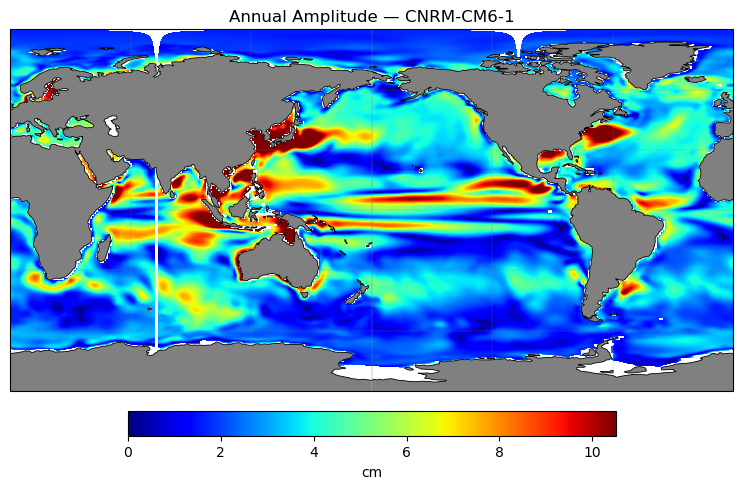

CNRM-CM6-1-HR


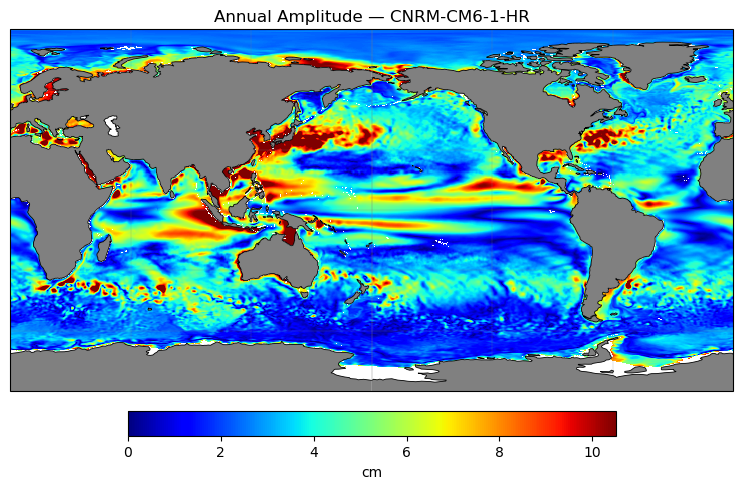

GFDL-ESM4


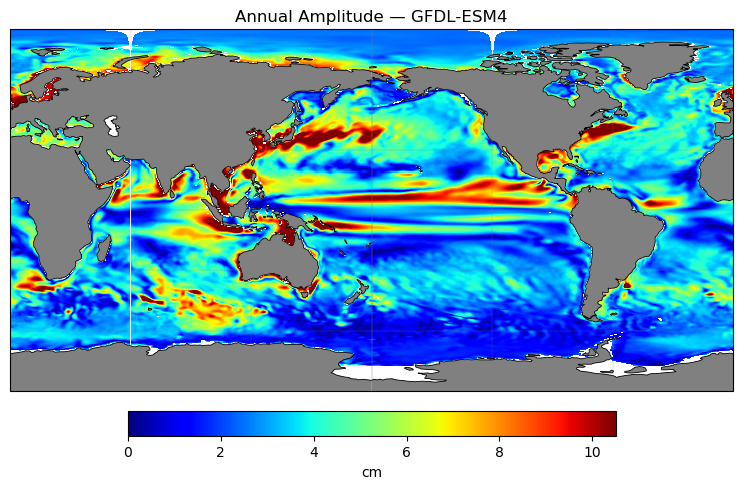

GFDL-CM4


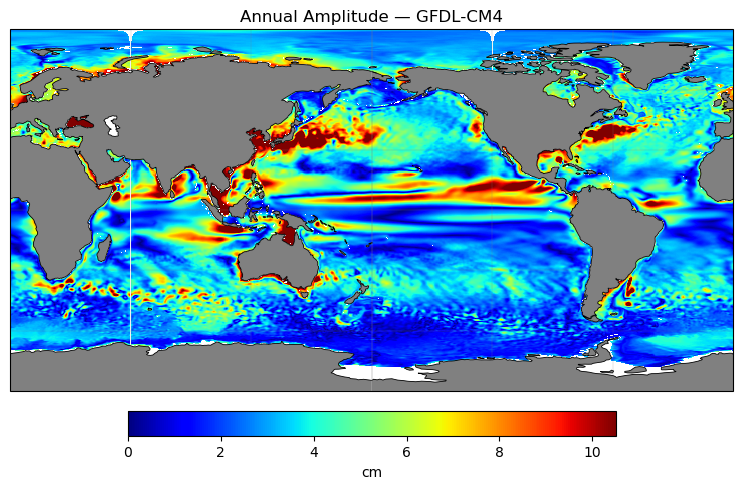

HadGEM3-GC31-LL


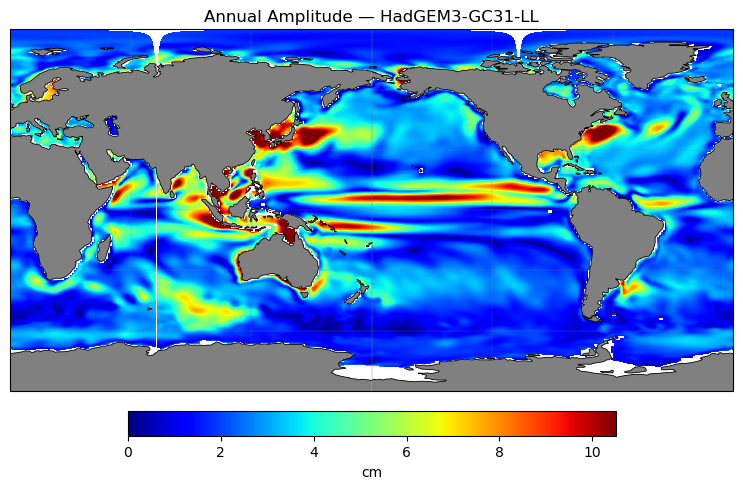

HadGEM3-GC31-MM


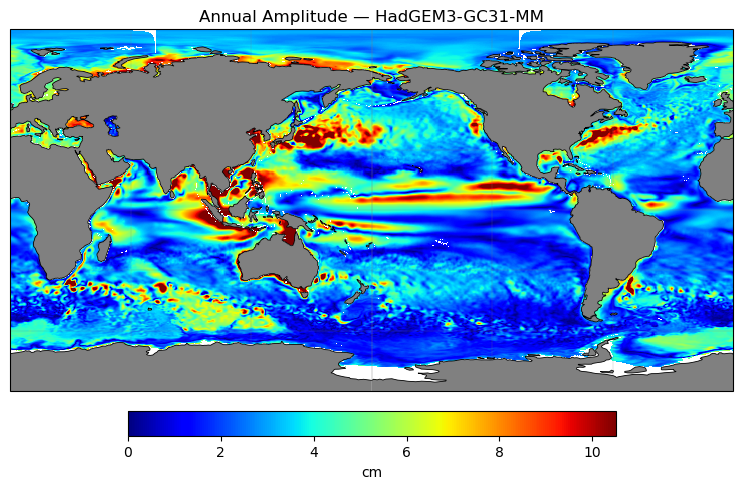

ECMWF-IFS-LR


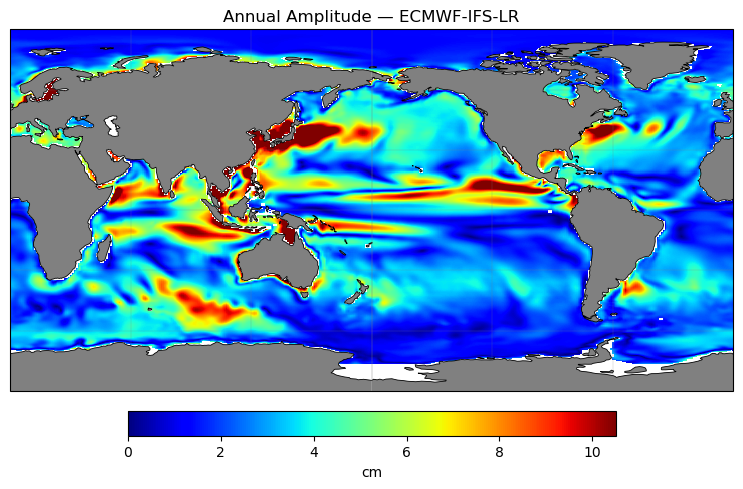

ECMWF-IFS-MR


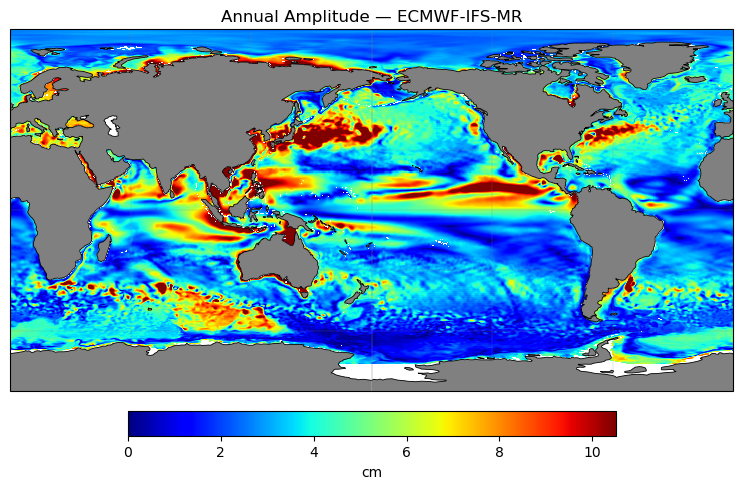

CPU times: user 1min 26s, sys: 7.15 s, total: 1min 33s
Wall time: 2min 21s


In [16]:
%%time
for i in range(len(source_ids)):
    print(source_ids[i])
    plot_amp_map(ha_outputs[i], 
                 var="A_sa", 
                 cmap="jet",
                 title = f"Annual Amplitude — {source_ids[i]}")

CNRM-CM6-1


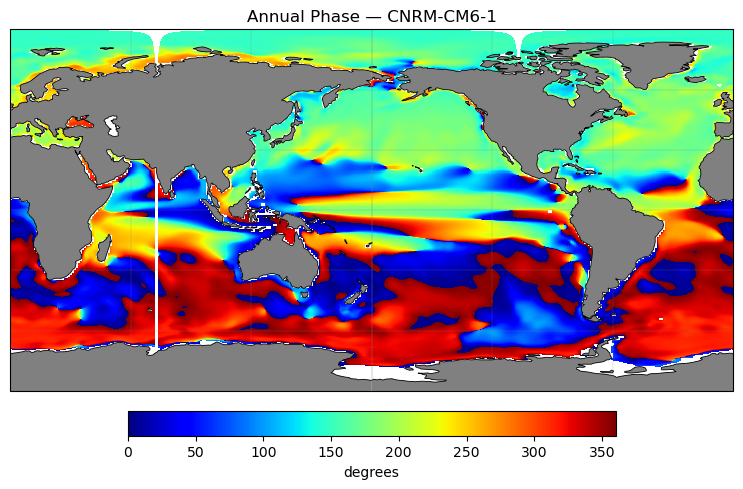

CNRM-CM6-1-HR


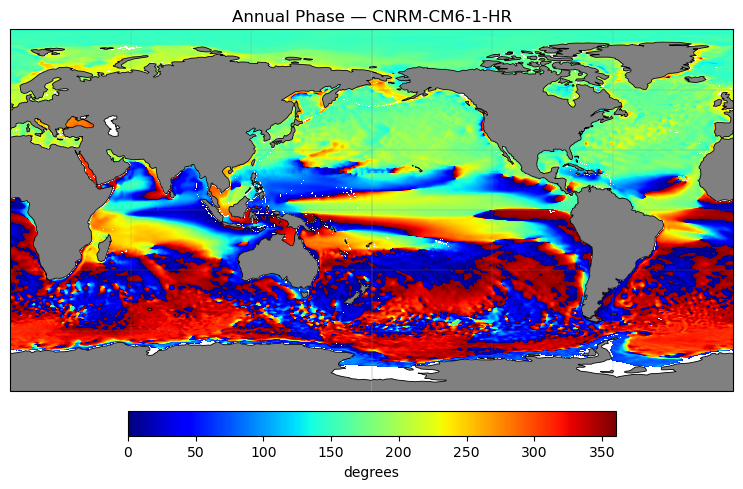

GFDL-ESM4


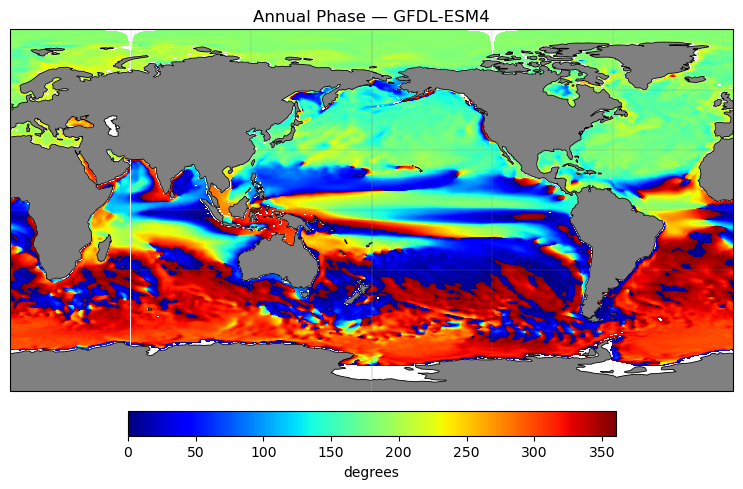

GFDL-CM4


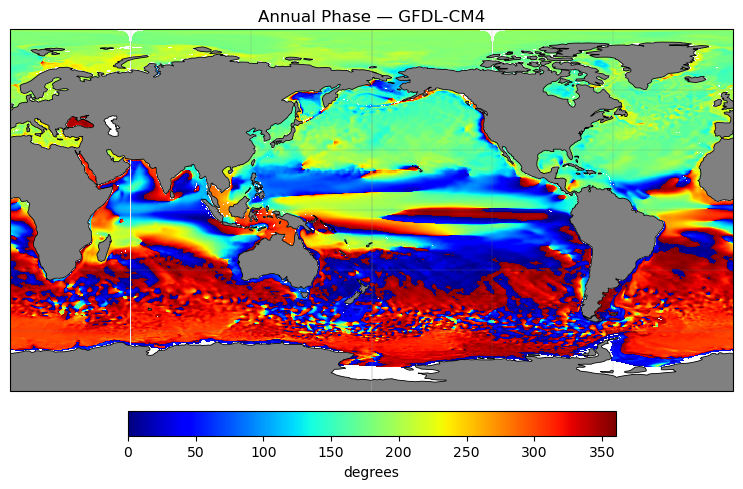

HadGEM3-GC31-LL


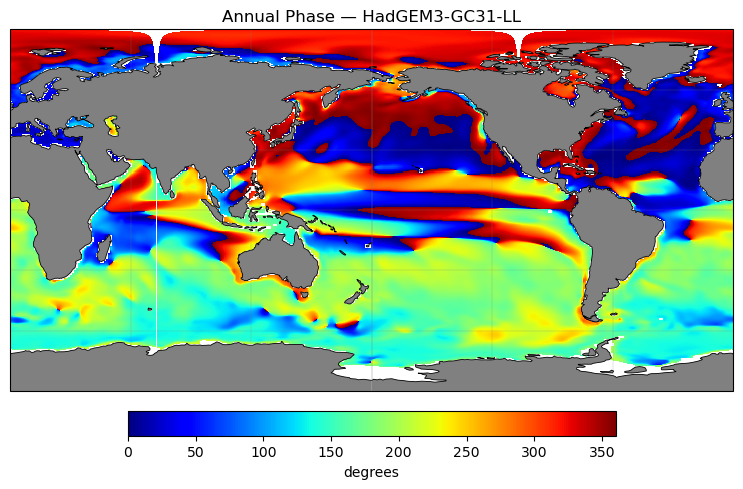

HadGEM3-GC31-MM


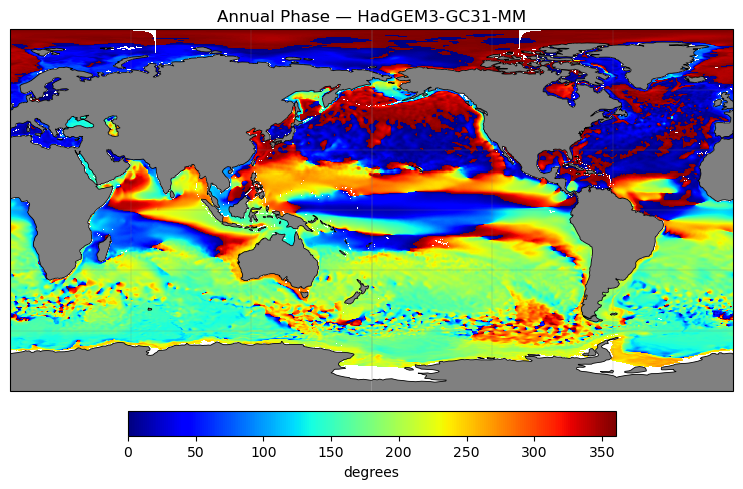

ECMWF-IFS-LR


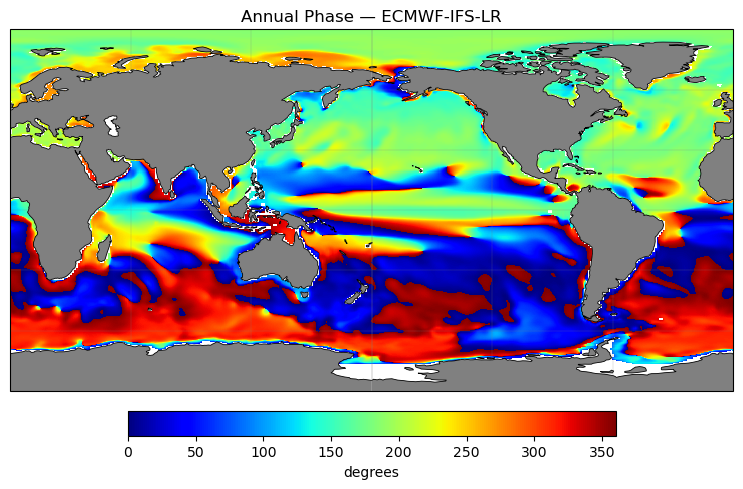

ECMWF-IFS-MR


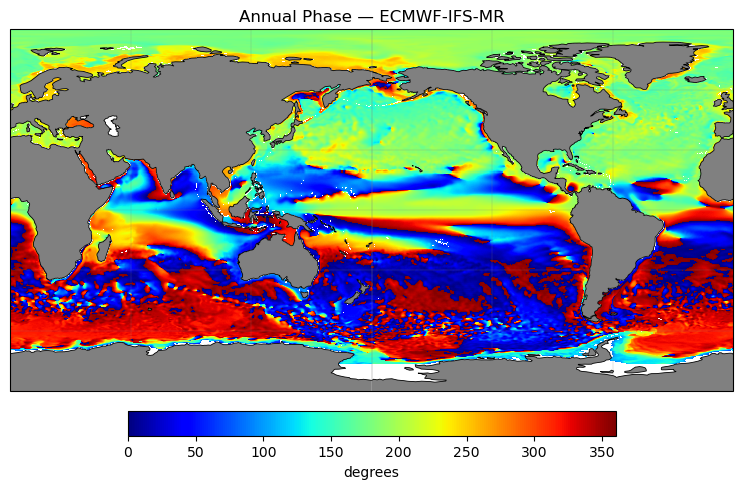

CPU times: user 1min 25s, sys: 6.94 s, total: 1min 32s
Wall time: 2min 10s


In [17]:
%%time
for i in range(len(source_ids)):
    print(source_ids[i])
    plot_phase_map(ha_outputs[i], 
                 var="phi_sa_deg", 
                 cmap="jet",
                 title = f"Annual Phase — {source_ids[i]}")

CNRM-CM6-1


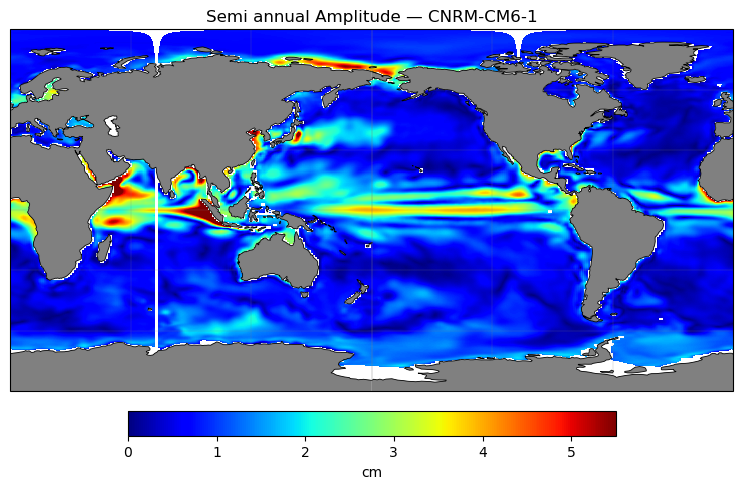

CNRM-CM6-1-HR


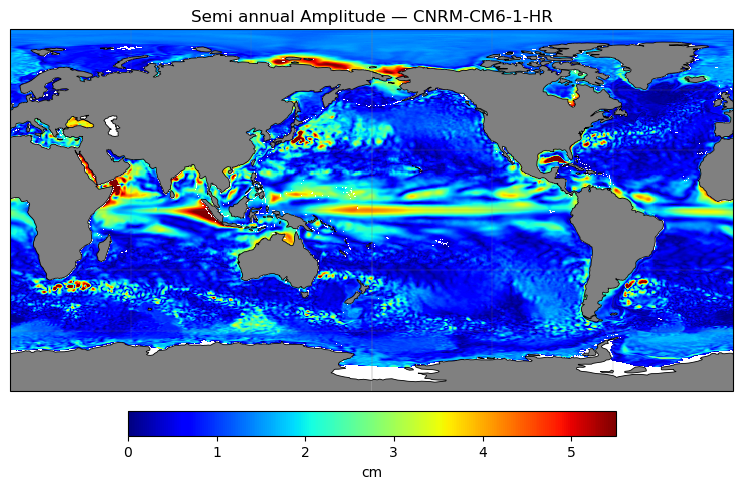

GFDL-ESM4


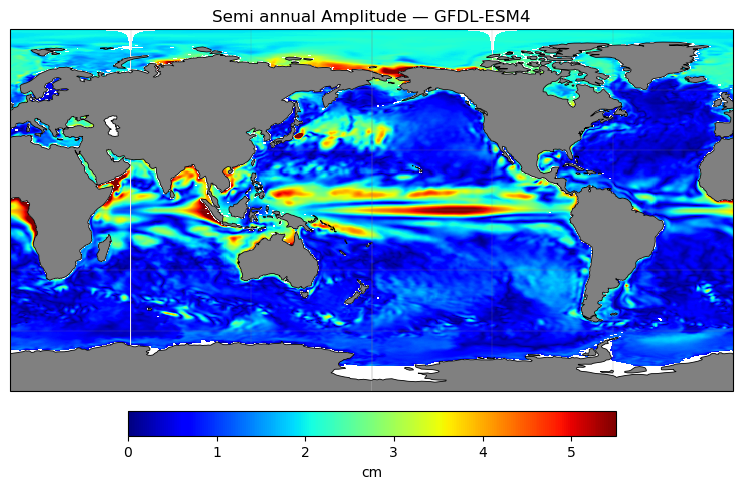

GFDL-CM4


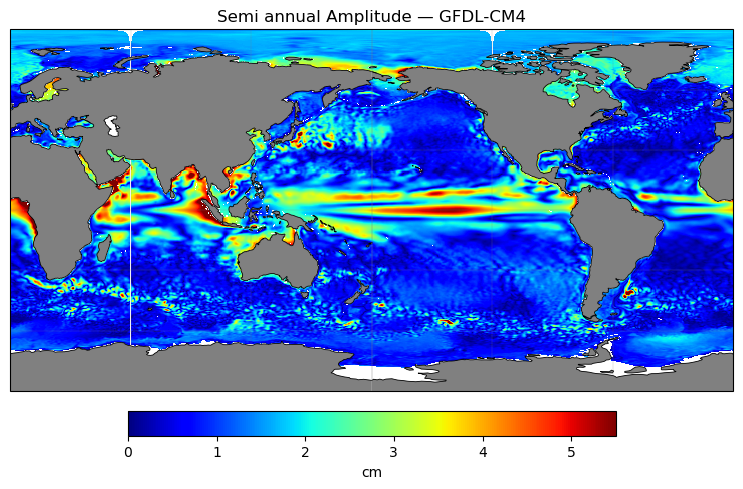

HadGEM3-GC31-LL


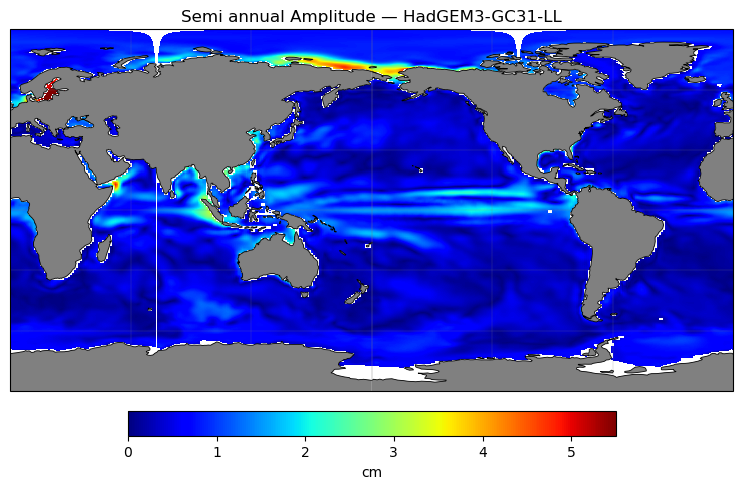

HadGEM3-GC31-MM


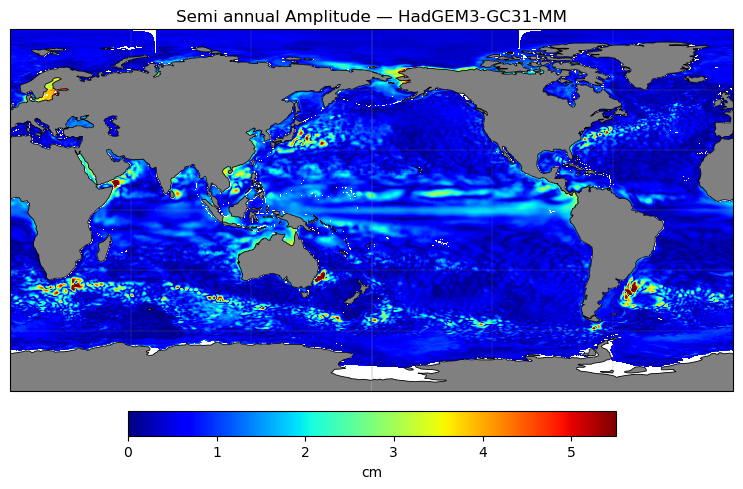

ECMWF-IFS-LR


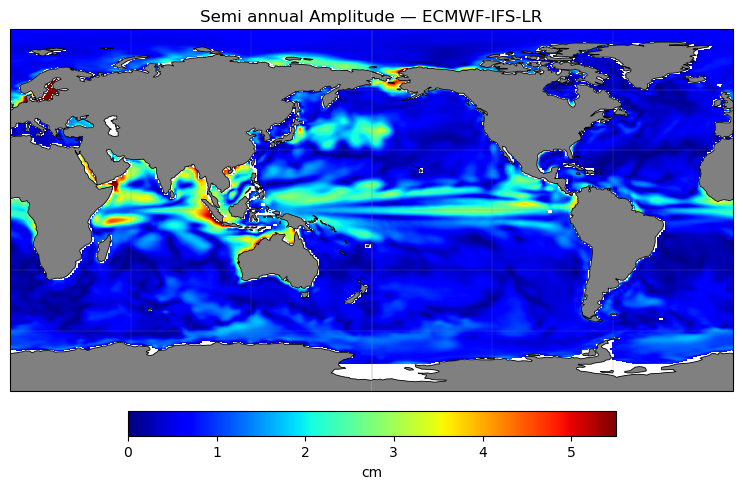

ECMWF-IFS-MR


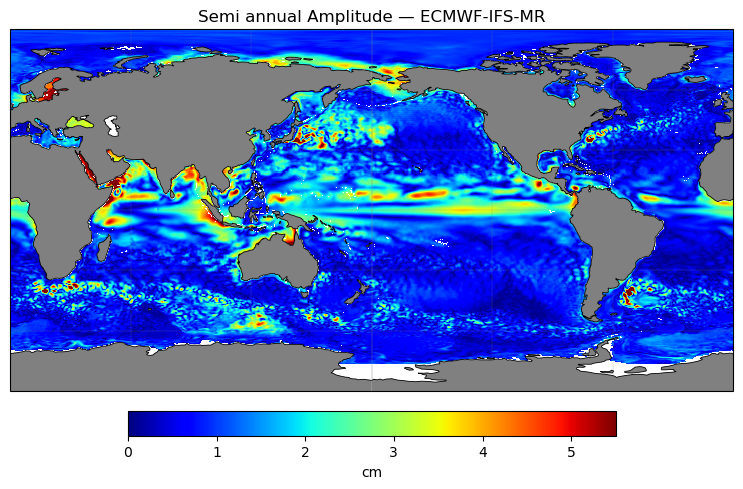

CPU times: user 1min 24s, sys: 6.79 s, total: 1min 31s
Wall time: 2min 8s


In [18]:
%%time
for i in range(len(source_ids)):
    print(source_ids[i])
    plot_amp_map(ha_outputs[i], 
                 var="A_ss", 
                 cmap="jet",
                 vmin=0, vmax=5.5,
                 title = f"Semi annual Amplitude — {source_ids[i]}")

CNRM-CM6-1


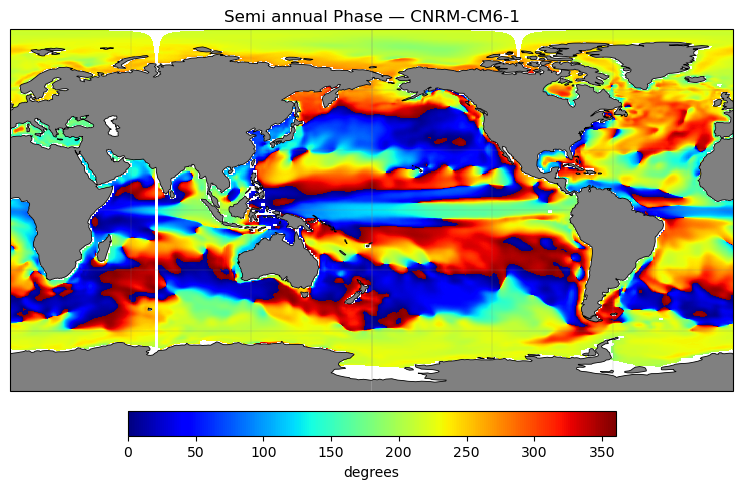

CNRM-CM6-1-HR


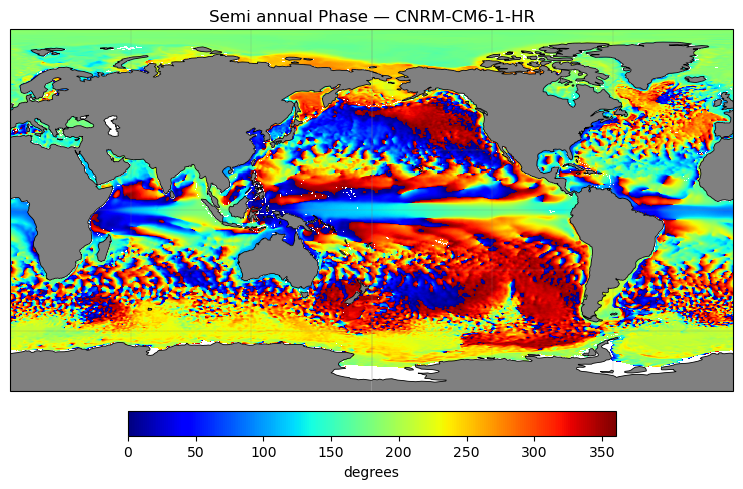

GFDL-ESM4


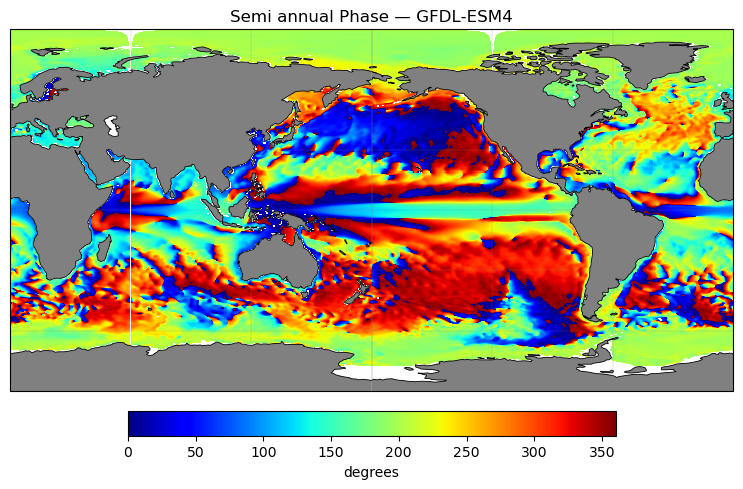

GFDL-CM4


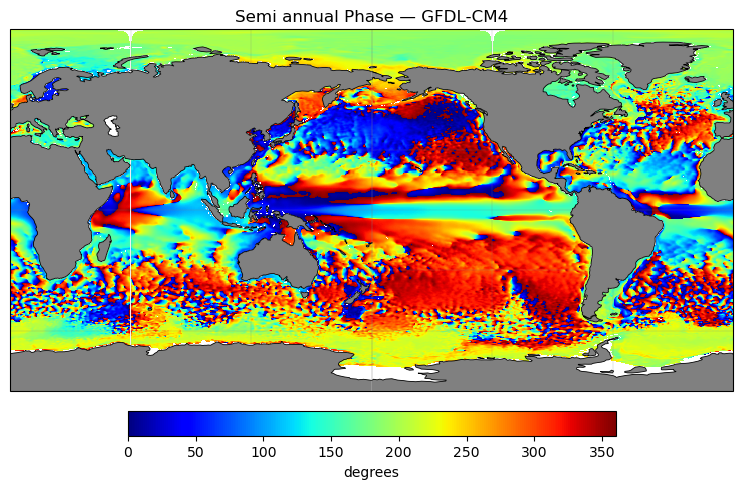

HadGEM3-GC31-LL


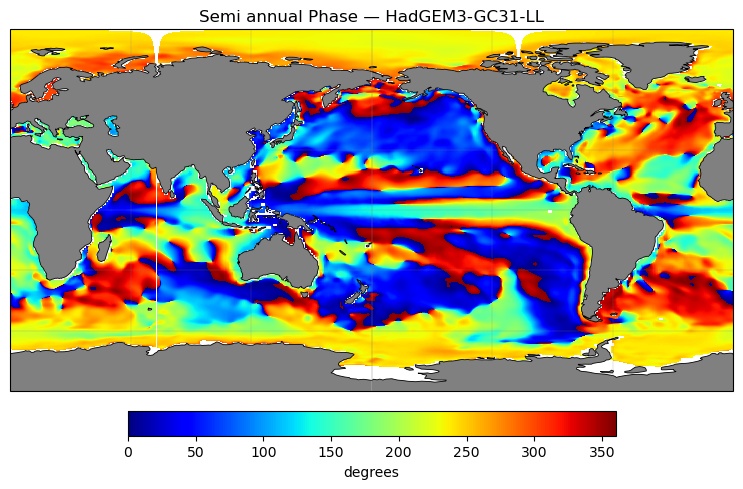

HadGEM3-GC31-MM


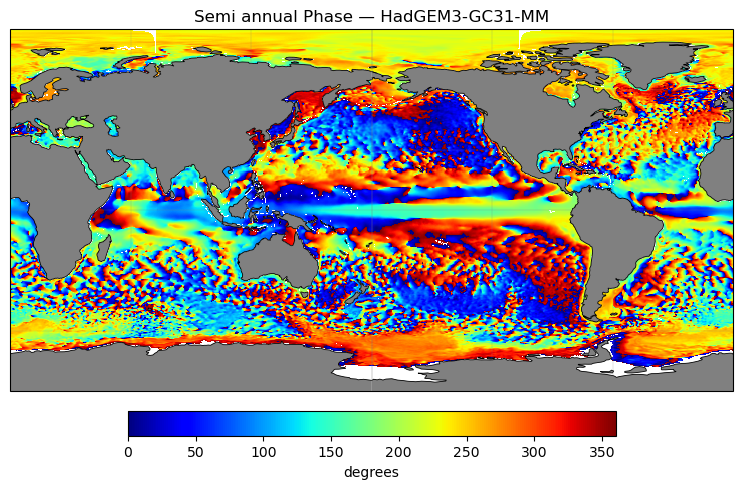

ECMWF-IFS-LR


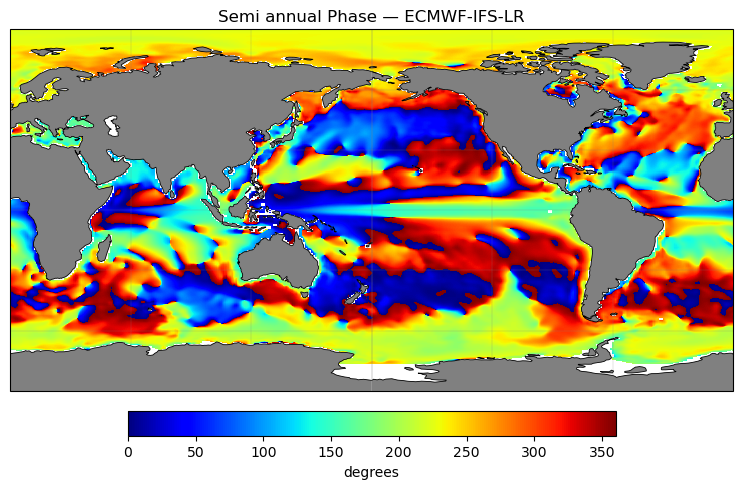

ECMWF-IFS-MR


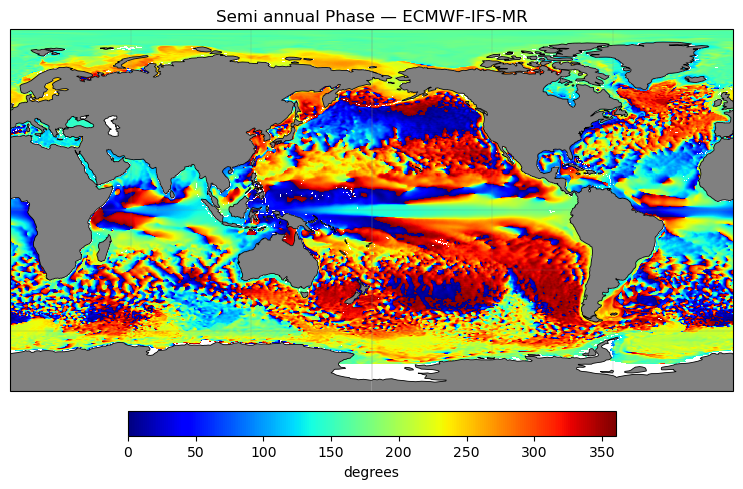

CPU times: user 1min 24s, sys: 6.62 s, total: 1min 31s
Wall time: 2min 9s


In [19]:
%%time
for i in range(len(source_ids)):
    print(source_ids[i])
    plot_phase_map(ha_outputs[i], 
                 var="phi_ss_deg", 
                 cmap="jet",
                 title = f"Semi annual Phase — {source_ids[i]}")

### Plotting HR LR Diffs

1 0


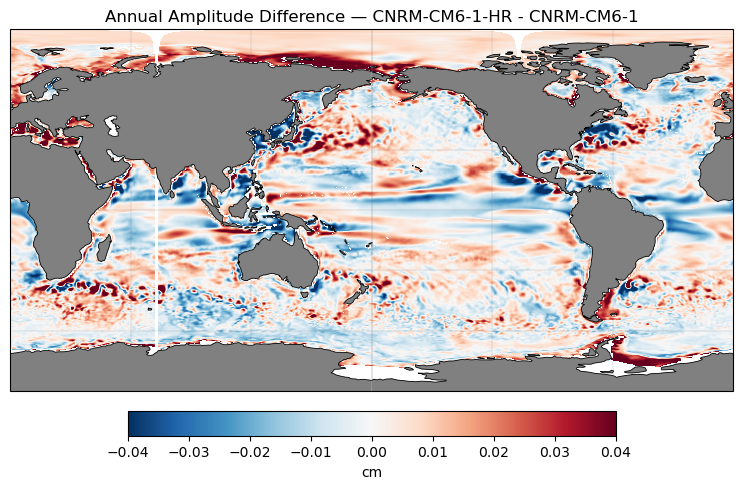

3 2


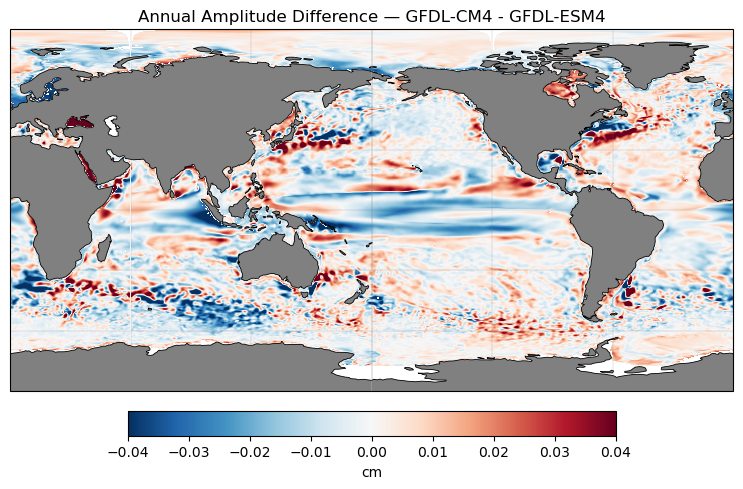

5 4


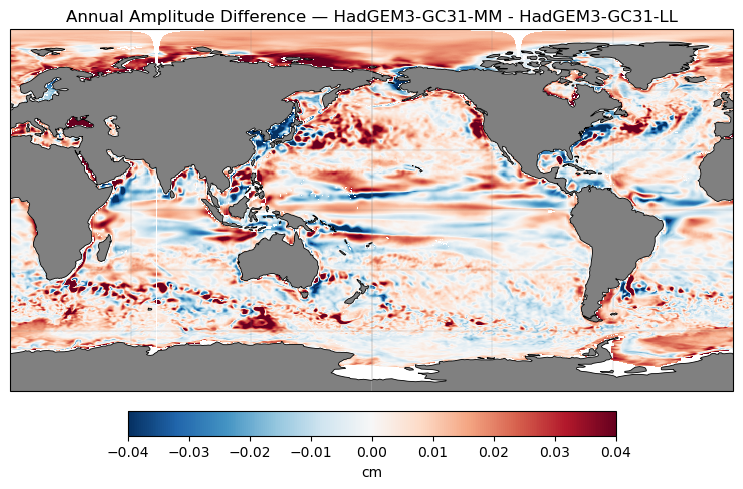

7 6


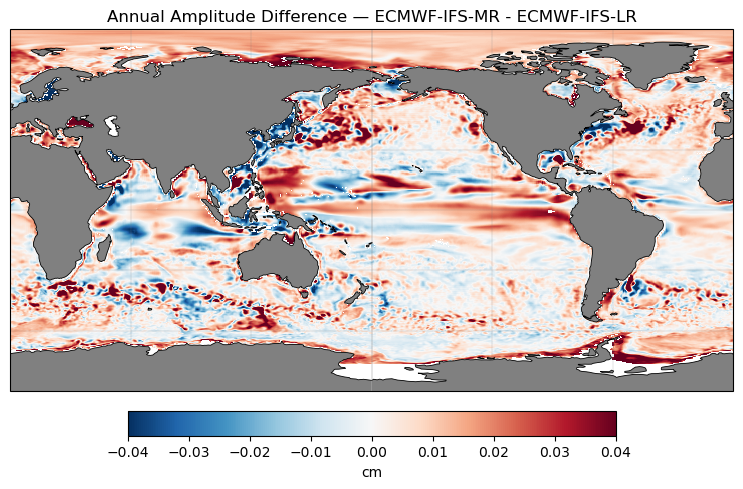

In [21]:
for i in range(0,4):
    hr = (2 * i) + 1
    lr = (2 * i)
    print(hr, lr)
    plot_res_dif(ha_outputs[hr], ha_outputs[lr], var="A_sa", mode = "amp", 
                 cmap="RdBu_r", projection="PlateCarree", central_longitude=180,
                 title = f"Annual Amplitude Difference — {source_ids[hr]} - {source_ids[lr]}")
    
    

1 0


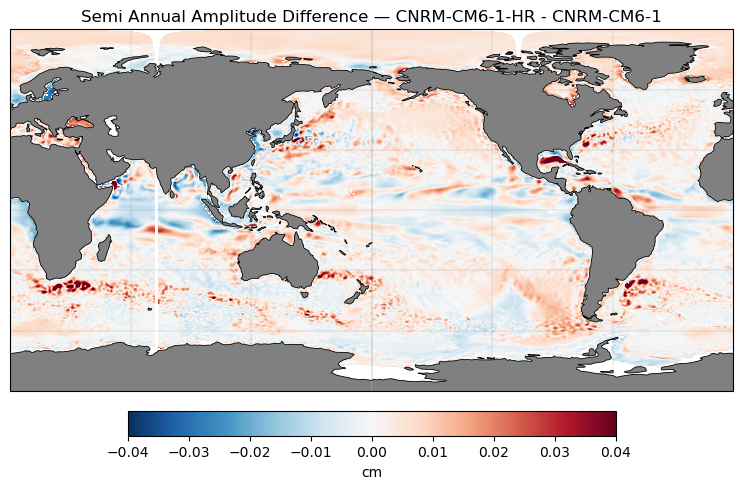

3 2


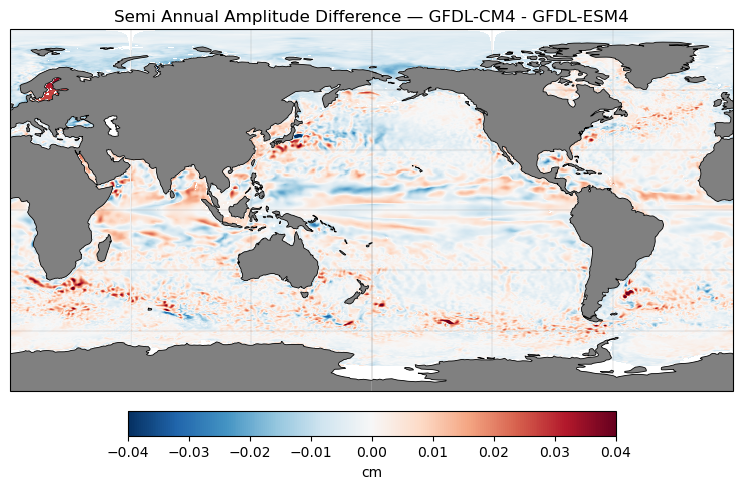

5 4


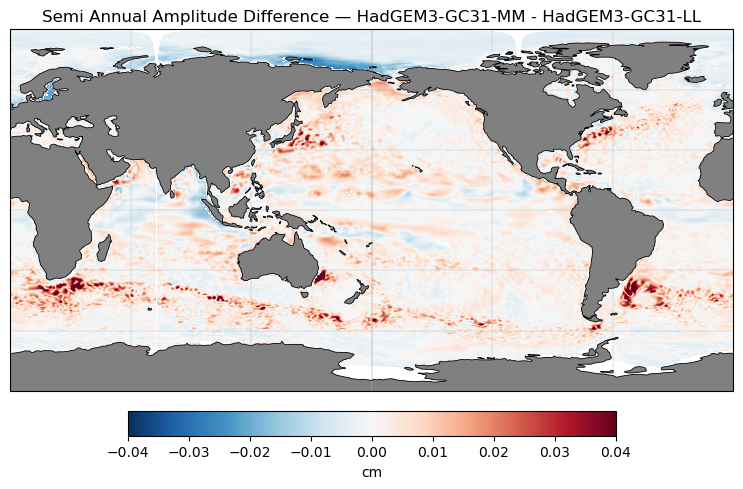

7 6


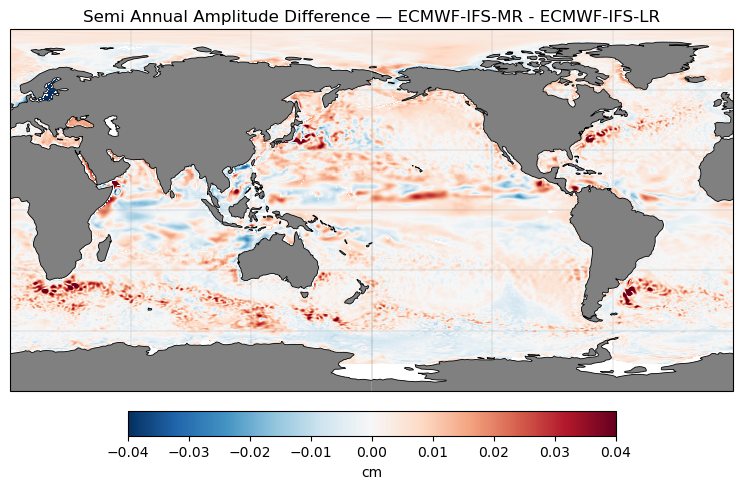

In [22]:
for i in range(0,4):
    hr = (2 * i) + 1
    lr = (2 * i)
    print(hr, lr)
    plot_res_dif(ha_outputs[hr], ha_outputs[lr], var="A_ss", mode = "amp", 
                 cmap="RdBu_r", projection="PlateCarree", central_longitude=180,
                 title = f"Semi Annual Amplitude Difference — {source_ids[hr]} - {source_ids[lr]}")
    
    

1 0


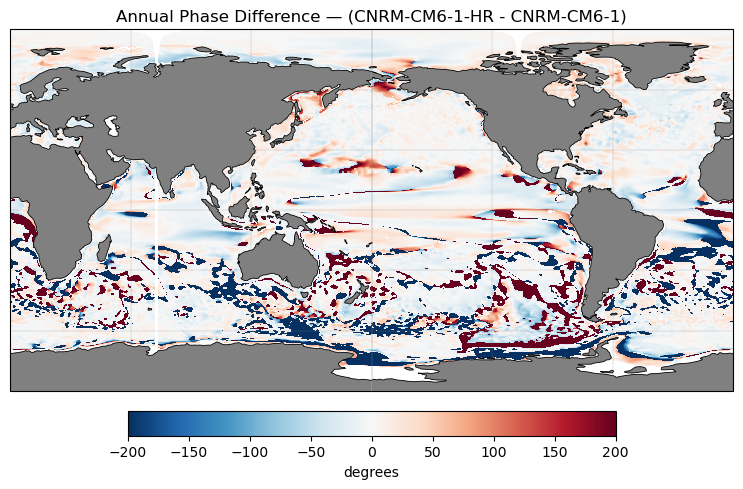

3 2


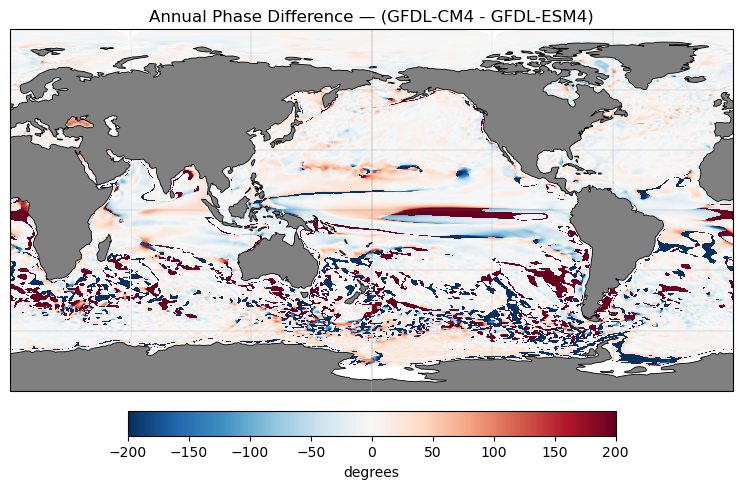

5 4


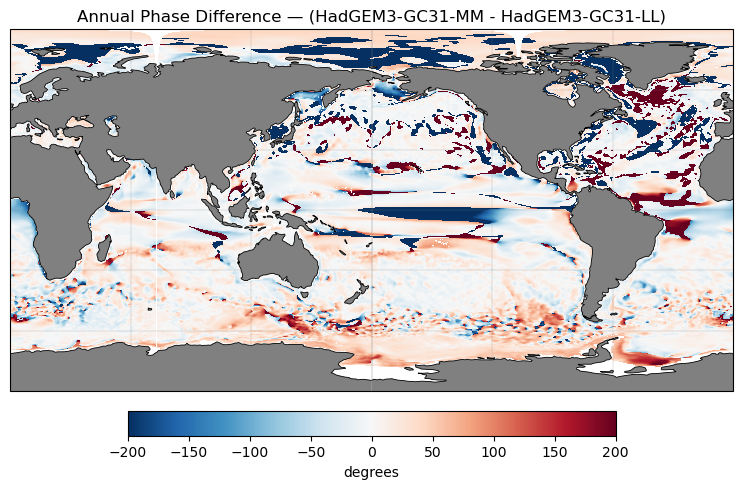

7 6


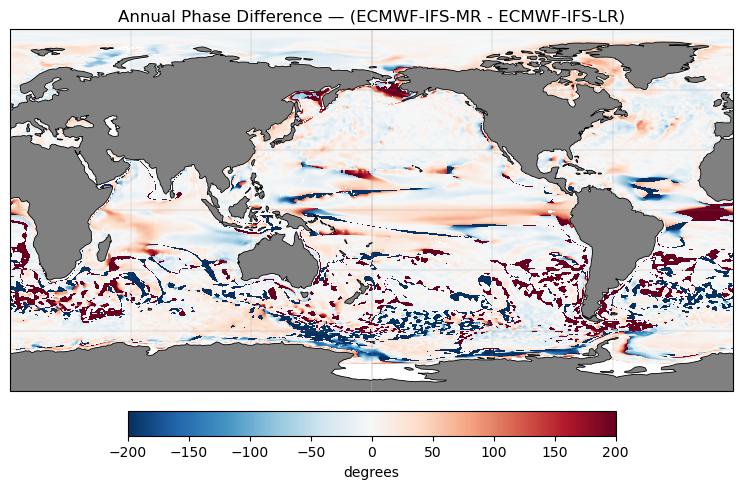

In [23]:
for i in range(0,4):
    hr = (2 * i) + 1
    lr = (2 * i)
    print(hr, lr)
    plot_res_dif(ha_outputs[hr], ha_outputs[lr], var="phi_sa_deg", mode = "phase", 
                 cmap="RdBu_r", projection="PlateCarree", central_longitude=180,
                 title = f"Annual Phase Difference — ({source_ids[hr]} - {source_ids[lr]})")
    
    

1 0


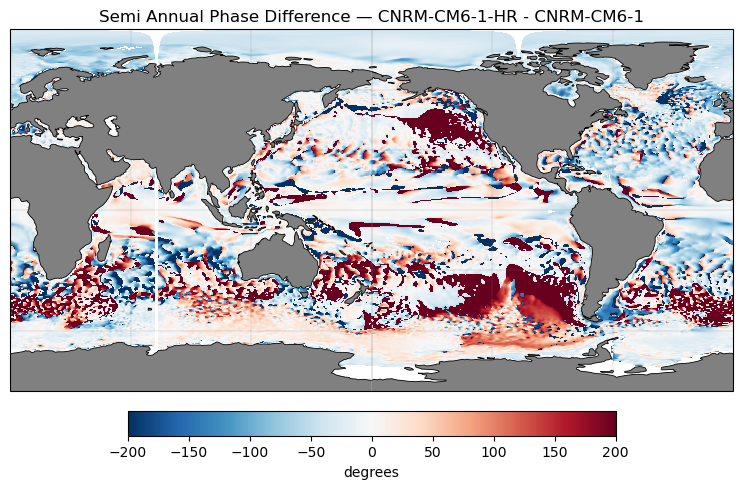

3 2


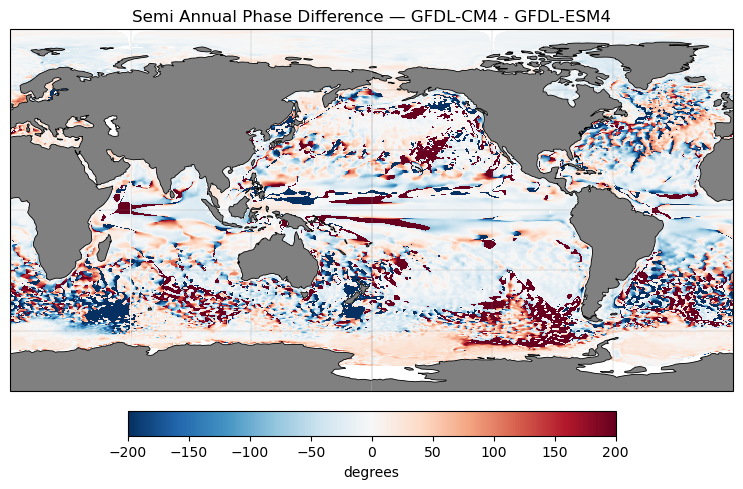

5 4


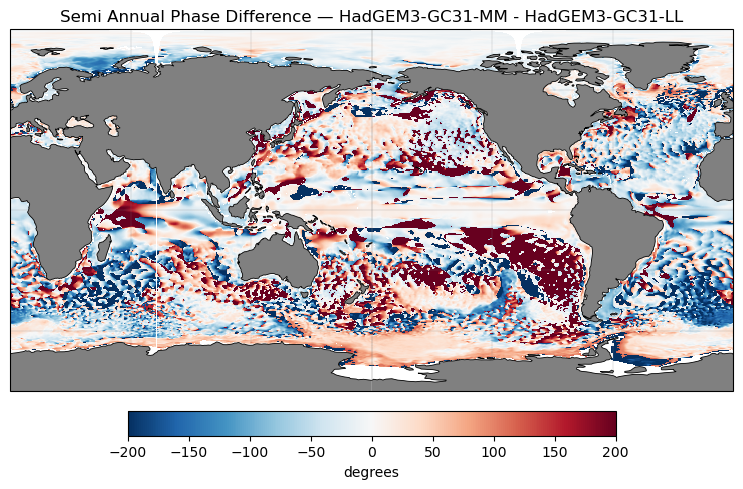

7 6


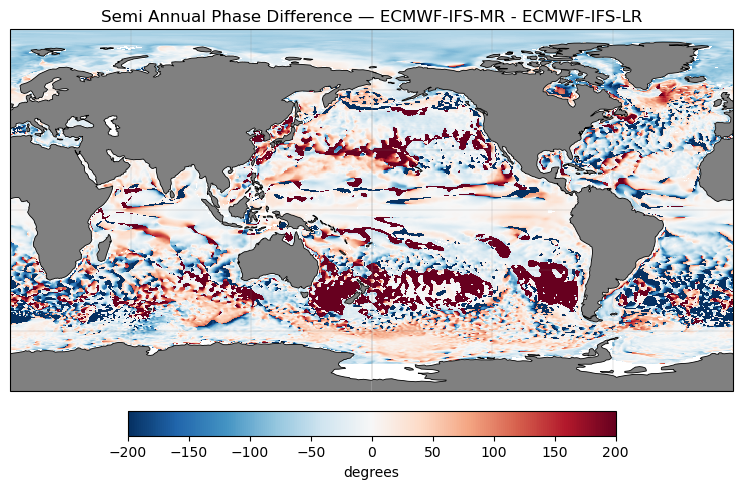

In [24]:
for i in range(0,4):
    hr = (2 * i) + 1
    lr = (2 * i)
    print(hr, lr)
    plot_res_dif(ha_outputs[hr], ha_outputs[lr], var="phi_ss_deg", mode = "phase", 
                 cmap="RdBu_r", projection="PlateCarree", central_longitude=180,
                 title = f"Semi Annual Phase Difference — {source_ids[hr]} - {source_ids[lr]}")
    
    

### Altimetry plots

In [54]:
#Read in Altimetry Data

alt_ds = xr.open_mfdataset('alt_sla_1x1_93_18.nc')
alt_ds = alt_ds/100
ha_alt_output = fit_harmonics_deg(alt_ds, var="ssh")

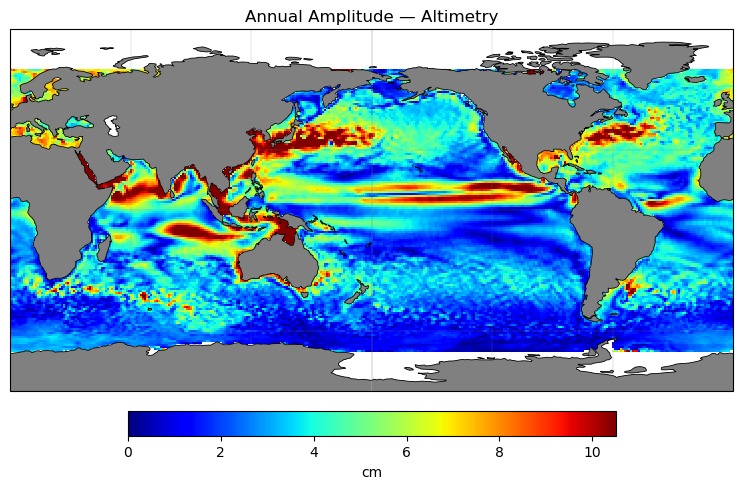

In [63]:
plot_amp_map(
    ha_alt_output, 
    var="A_sa", 
    cmap="jet",
    title="Annual Amplitude — Altimetry"
)

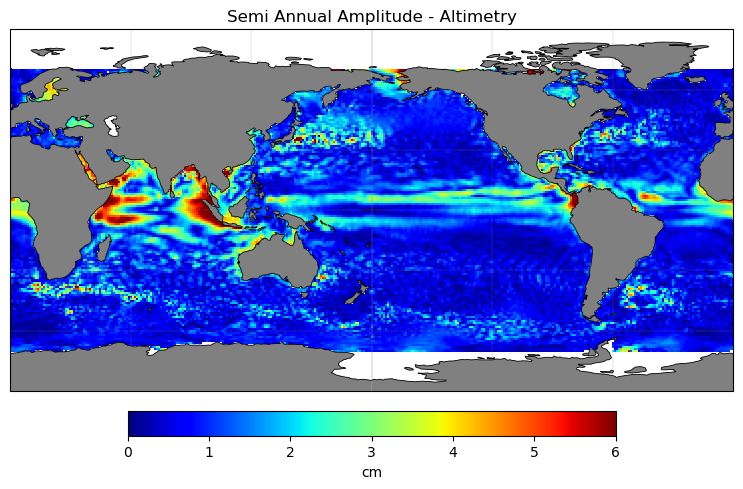

In [64]:
plot_amp_map(ha_alt_output, 
                 var="A_ss", 
                 cmap="jet",
                 vmin = 0,
                 vmax = 6,
                 title = f"Semi Annual Amplitude - Altimetry")



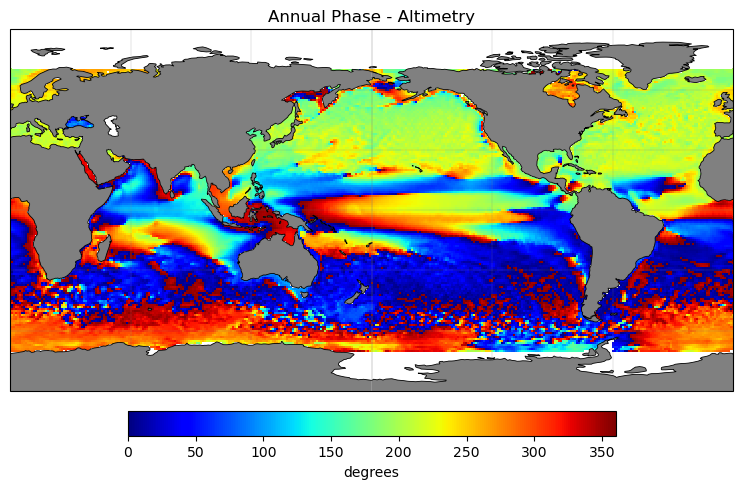

In [65]:
plot_phase_map(ha_alt_output, 
                 var="phi_sa_deg", 
                 cmap="jet",
                 title = f"Annual Phase - Altimetry")


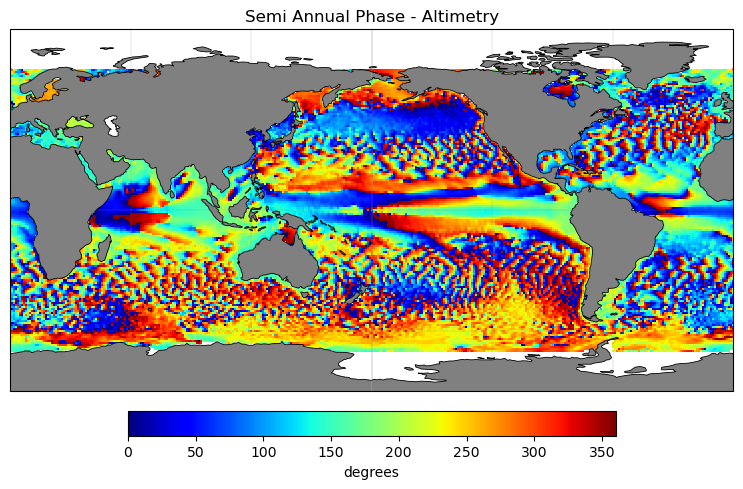

In [66]:
plot_phase_map(ha_alt_output, 
                 var="phi_ss_deg", 
                 cmap="jet",
                 title = f"Semi Annual Phase - Altimetry")

### Roughwork - No functional code beyond this point